# Imports

In [118]:
import os
import random
import cv2
import numpy as np
from ultralytics import YOLO  # Assure-toi d'avoir installé `ultralytics`
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torch.nn as nn
from torchvision import models, transforms
import cv2
import numpy as np
from scipy.optimize import minimize_scalar



## Bounding boxes

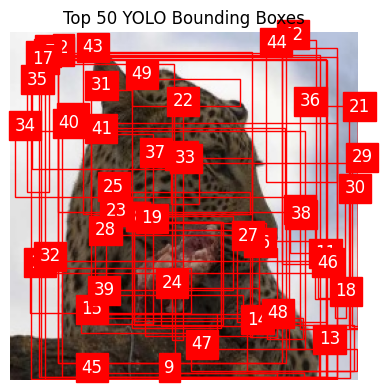

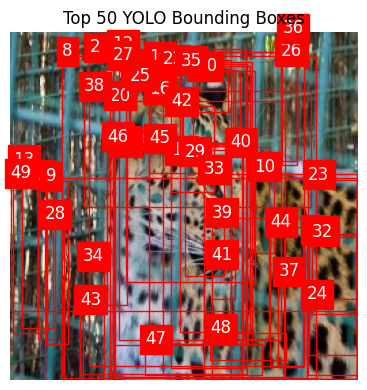

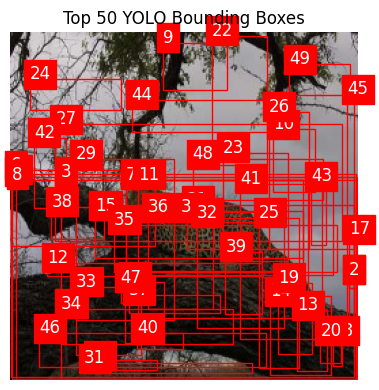

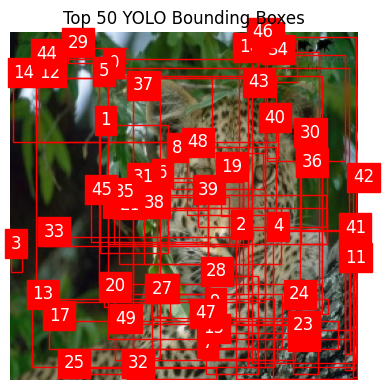

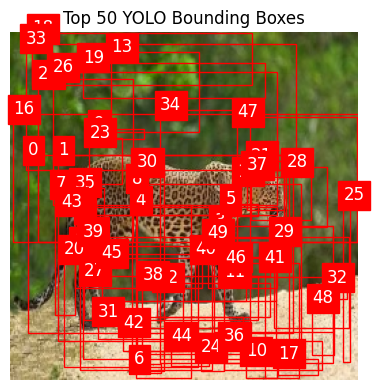

In [136]:
def process_images_yolo(input_folder, num_boxes=10, model_name='yolov8n.pt'):
    """
    Process images using YOLO to get bounding boxes.
    If there are fewer than num_boxes, random boxes are added.
    Returns:
        all_bounding_boxes: dict {image_path: list of (x1, y1, x2, y2)}
    """
    global_m_vector = []
    m_vectors = {}
    all_bounding_boxes = {}
    plotted_count = 0

    # Load YOLO model
    model = YOLO(model_name)

    # Iterate over images
    for filename in os.listdir(input_folder):
        if not filename.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff')):
            continue

        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error loading image: {filename}")
            continue

        height, width = image.shape[:2]

        # Perform YOLO detection
        results = model(image_path, verbose=False, conf = 0.01)
        boxes = []
        confidences = []

        for result in results:
            
            if result.boxes is not None and len(result.boxes) > 0:
                for box, conf in zip(result.boxes.xyxy.cpu().numpy(), result.boxes.conf.cpu().numpy()):
                    boxes.append([int(box[0]), int(box[1]), int(box[2]), int(box[3])])
                    confidences.append(float(conf))

        # Keep only top `num_boxes` boxes (YOLO doesn't always provide confidence by default)
        boxes = boxes[:num_boxes]
        confidences = confidences[:num_boxes]


        # If fewer than `num_boxes`, add random boxes
        while len(boxes) < num_boxes:
            x1 = random.randint(0, width - 4)
            y1 = random.randint(0, height - 4)
            x2 = random.randint(x1 + 4, width)
            y2 = random.randint(y1 + 4, height)
            boxes.append([x1, y1, x2, y2])
            confidences.append(0)

        all_bounding_boxes[image_path] = boxes
        global_m_vector.extend(confidences)

        # Optional visualization for first 5 images
        if plotted_count < 5:
            fig, ax = plt.subplots(1, figsize=(6, 4))
            ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            for i, box in enumerate(boxes):
                rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                                         fill=False, edgecolor='red', linewidth=1)
                ax.add_patch(rect)
                ax.text(box[0], box[1], str(i), color='white', fontsize=12, backgroundcolor='red')
            ax.set_title(f'Top {num_boxes} YOLO Bounding Boxes')
            ax.axis('off')
            plt.tight_layout()
            plt.show()
            plotted_count += 1

    return all_bounding_boxes, global_m_vector

# Example usage
input_folder = "./leopard"
bounding_boxes_yolo, global_m_vector = process_images_yolo(input_folder, num_boxes=50)


In [137]:
len(global_m_vector)

4150

# Extract features

In [122]:
# Préparer le modèle ResNet
resnet = models.resnet50(pretrained=True)
resnet.eval()  # mode évaluation
# On enlève la dernière couche fully connected pour récupérer les features
feature_extractor = nn.Sequential(*list(resnet.children())[:-1])

# Transformation des images pour ResNet
preprocess = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def extract_resnet_features(bounding_boxes, device='cpu'):
    all_features = {}
    X = []

    feature_extractor.to(device)

    for image_name, bboxes in bounding_boxes.items():
        image = cv2.imread(image_name)
        if image is None:
            continue  # Skip if image not found
        
        features = []
        for bbox in bboxes:
            x1, y1, x2, y2 = bbox
            roi = image[y1:y2, x1:x2]
            if roi.size == 0:
                continue  # Skip empty ROIs
            
            input_tensor = preprocess(roi).unsqueeze(0).to(device)
            
            with torch.no_grad():
                output = feature_extractor(input_tensor)
                feature_vector = output.squeeze().cpu().numpy()  # shape (2048,)
            
            features.append(feature_vector)
            X.append(feature_vector)
        
        all_features[image_name] = features

    return np.array(X)

boxes_dict = bounding_boxes_yolo#[0]  # récupérer seulement le dictionnaire
# Exemple d'utilisation
X = extract_resnet_features(boxes_dict)
print(X.shape)


(4150, 2048)


In [140]:
print(X.shape)


(4150, 2048)


# Optimization problem


## Box similarity 

$ L $ is the normalized Laplacian matrix defined as
$$
L = I - D^{-1/2} S\, D^{-1/2},
$$

In [141]:
def cosine_similarity_matrix(features):
    """
    Computes the cosine similarity matrix between feature vectors.
    """
    # Compute the L2 norm of each feature vector
    norms = np.linalg.norm(features, axis=1, keepdims=True)
    
    # Normalize the feature vectors to unit length
    normalized_features = features / (norms + 1e-10)

    # Compute the cosine similarity matrix
    # The dot product gives cosine similarity, adjusted to be in range [0, 1]
    similarity_matrix = (np.dot(normalized_features, normalized_features.T) + 1) / 2

    return similarity_matrix


In [142]:
def compute_normalized_laplacian(features):
    """
    Computes the normalized Laplacian matrix from feature vectors.
    """
   # Compute the similarity matrix S using cosine similarity
    S = cosine_similarity_matrix(features)
    np.fill_diagonal(S, 0)

    row_sums = np.sum(S, axis=1)
    

    # Compute the inverse square root of D
    D_inv_sqrt = np.diag(1.0 / np.sqrt(row_sums + 1e-10))


    # Compute the normalized Laplacian matrix L
    L = np.eye(S.shape[0]) - D_inv_sqrt @ S @ D_inv_sqrt

    return L


## Box Discriminability


$ A $ is a discriminative clustering term  defined as
$$
A = \frac{1}{n_b}\left(\Pi_{n_b}\Bigl(I_{n_b} - X_{\text{box}}\Bigl(X_{\text{box}}^T \Pi_{n_b} X_{\text{box}} + n_b\kappa I\Bigr)^{-1}X_{\text{box}}^T\Bigr)\Pi_{n_b}\right),
$$
where the centering projection matrix is given by
$$
\Pi_{n_b} = I_{n_b} - \frac{1}{n_b}\mathbf{1}_{n_b}\mathbf{1}_{n_b}^T.
$$

In [143]:
def compute_discriminability_matrix(X_box, kappa):
    """
    Computes the discriminability matrix A for the given boxes.
    """

    nb_boxes = X_box.shape[0]  # Number of boxes (samples)

    d = X_box.shape[1]  # Feature dimension

    
    I_nb = np.eye(nb_boxes)  # Identity matrix of size (nb_boxes x nb_boxes)
    I_ = np.eye(d)  # Identity matrix of size (d x d)
    ones_nb = np.ones((nb_boxes, 1))  # Column vector of ones
    
    # Centering projection matrix
    P_nb = I_nb - (1 / nb_boxes) * (ones_nb @ ones_nb.T)  

    # Compute the inverse term
    inverse_term = np.linalg.inv(X_box.T @ P_nb @ X_box + nb_boxes * kappa * I_)

    # Compute the discriminative term
    discriminative_term = P_nb @ P_nb - P_nb @ X_box @ inverse_term @ X_box.T @ P_nb

    # Normalize by nb_boxes to obtain A
    A = (1 / nb_boxes) * discriminative_term

    return A



## Problem formulation 

The constraints ensure that we select exactly one box per image.
\begin{equation}
\min_{z} \; z^T (L + \mu A) z - \lambda\, z^T \log(m)
\end{equation}
subject to
$$
\forall I_j \in I: \quad \sum_{k=1}^{m} z_{j,k} = 1,
$$

In [144]:
n = len(bounding_boxes_yolo) # number of images
m = len(bounding_boxes_yolo["./leopard/0CI4GDFEZNZ0.jpg"]) # number of bounding boxes per image
n_b = n*m # total number of bounding boxes

lambda_ = 0.4  # Regularization parameter
mu = 50 # Trade-off parameter
A = compute_discriminability_matrix(X, 10)  # Compute discriminability matrix
L = compute_normalized_laplacian(X)  # Compute normalized Laplacian matrix

global_m_vector = np.array(global_m_vector)

# objective function and gradient
def f(z):
    return z.T @ (L+mu*A) @ z - lambda_ * z.T @ np.log(global_m_vector + 1e-10)

def grad_f(z):
    return 2* (L+mu*A) @ z - lambda_ * np.log(global_m_vector + 1e-10)



# Frank-Wolfe algorithm

On a convex set $ \mathcal{D} $, the Frank-Wolfe algorithm finds the global minimum of $ f $ over $ \mathcal{D} $ by solving a succession of linear problems over the convex set:

\begin{equation}
    \min_{y} \quad y^T \nabla f(z_{k-1})
    \quad \text{subject to} \quad y \in \mathcal{D}.
\end{equation}

And update:

\begin{equation}
    z_k = z_{k-1} + \lambda (y_k - z_{k-1}),
\end{equation}


For each image, we can take the argmin of the cost function over the constraints since the problem is separable. The complexity is $\mathcal{O}(n*m)$ instead of $\mathcal{O}(n*m*log(n*m)$ for a projected gradient algorithm.

In [145]:
image_indices = {}
start = 0
for image in sorted(bounding_boxes_yolo.keys()):
    end = start + len(bounding_boxes_yolo[image])
    image_indices[image] = (start, end)
    start = end



def optimize_bounding_boxes(f, gradient_f, n_b, max_iterations=100, tol=1e-9):
    # --- init y0 (feasible vertex selection: one hot per image block) ---
    y0 = np.zeros(n_b)
    for image, (start, end) in image_indices.items():
        idx = np.random.randint(start, end)
        y0[idx] = 1.0

    # z starts exactly at vertex y0
    z = y0.copy()
    # Active set S: dict mapping vertex_tuple -> alpha (weight)
    S = {tuple(y0): 1.0}
    y_star = y0.copy()
    objective_values = []
    objective_discret_values = []
    rounding_count = 0

    print("f(z) initial =", f(z))

    for k in range(1, max_iterations + 1):
        # compute gradient at current z once
        grad = gradient_f(z)

        objective_values.append(f(z))
        objective_discret_values.append(f(y_star))

        # --- Forward (FW) vertex: choose per-block argmin of grad ---
        y_k = np.zeros(n_b)
        for image, (start, end) in image_indices.items():
            block_grad = grad[start:end]
            rel_idx = np.argmin(block_grad)
            y_k[start + rel_idx] = 1.0

        # --- Away step: choose x_k from S that maximizes <s, grad> ---
        max_val = -np.inf
        x_k = None
        alpha_x = 0.0
        for s_tuple, alpha in S.items():
            s_arr = np.array(s_tuple)
            val = s_arr.dot(grad)
            if val > max_val:
                max_val = val
                x_k = s_arr
                alpha_x = alpha

        # Decide direction: FW or Away
        fw_gap = (y_k - z).dot(grad)
        away_gap = (z - x_k).dot(grad)
        if fw_gap <= away_gap:
            # FW step (move towards y_k)
            d_k = y_k - z
            gamma_max = 1.0
            is_away = False
        else:
            # Away step (move away from x_k)
            d_k = z - x_k
            # gamma_max = alpha_x / (1 - alpha_x) (safe even if alpha_x close to 1)
            if 1.0 - alpha_x <= 0:
                gamma_max = 1.0  # fallback
            else:
                gamma_max = alpha_x / (1.0 - alpha_x)
            is_away = True

        # Line search on gamma in [0, gamma_max]
        res = minimize_scalar(lambda gamma: f(z + gamma * d_k),
                              bounds=(0, gamma_max), method='bounded')
        gamma_k = float(res.x)

        # Update z
        z = z + gamma_k * d_k

        # --- Update alphas (weights of vertices in S) ---
        # If FW step: new alphas = (1-gamma)*old_alphas; add gamma for y_k vertex
        yk_tuple = tuple(y_k)
        if not is_away:
            # scale existing
            for s in list(S.keys()):
                S[s] = (1.0 - gamma_k) * S[s]
            # add / increase weight of y_k
            S[yk_tuple] = S.get(yk_tuple, 0.0) + gamma_k
        else:
            # Away step update: alpha_v' = (1+gamma) * alpha_v (for v != x_k)
            # and for x_k: alpha_x' = (1+gamma) * alpha_x - gamma
            for s in list(S.keys()):
                S[s] = (1.0 + gamma_k) * S[s]
            xk_tuple = tuple(x_k)
            S[xk_tuple] = S.get(xk_tuple, 0.0) - gamma_k  # (1+g)alpha_x - g  implemented via subtraction
            # numeric cleanup: small negatives -> zero
            if S[xk_tuple] < 0 and S[xk_tuple] > -1e-12:
                S[xk_tuple] = 0.0

        # remove tiny weights and keep keys consistent
        small_thresh = 1e-12
        S = {s: a for s, a in S.items() if a > small_thresh}

        # renormalize to avoid drifting numerical error (sum should be 1)
        total_alpha = sum(S.values())
        if total_alpha <= 0:
            # reset to z as convex combination of current vertices discovered (fallback)
            S = {tuple(z): 1.0}
            total_alpha = 1.0
        else:
            for s in S:
                S[s] = S[s] / total_alpha

        # # update discrete best if improved
        # if f(y_k) < f(y_star):
        #     y_star = y_k.copy()
        #     rounding_count += 1
        # Au lieu de juste tester y_k, tester tous les vertices dans S
        if k % 5 == 0:  # tous les 5 iterations
            y_rounded = np.zeros(n_b)
            for image, (start, end) in image_indices.items():
                sub_z = z[start:end]
                rel_arg = np.argmax(sub_z)
                y_rounded[start + rel_arg] = 1.0
            
            if f(y_rounded) < f(y_star):
                y_star = y_rounded.copy()

        if k % 20 == 0 or k == 1:
            print(f"Iteration {k}, f(z) = {f(z):.6g}, f(y_star) = {f(y_star):.6g}, |S| = {len(S)}")

        # optional stopping based on FW gap (duality gap) or tiny change
        # simple check on norm(d_k)*gamma
        if np.linalg.norm(gamma_k * d_k) < tol:
            print("small step -> stopping")
            break

    # Rounding 2: pick best index in each block from z
    y_r = np.zeros(n_b)
    for image, (start, end) in image_indices.items():
        sub_z = z[start:end]
        rel_arg = np.argmax(sub_z)
        y_r[start + rel_arg] = 1.0

    if f(y_r) < f(y_star):
        print("ROUNDING 2 improved")
        y_star = y_r
        objective_discret_values.append(f(y_star))
    else:
        print("NO ROUNDING 2")

    print(f"Converged in {k} iterations")
    print(f"Rounding 1 count: {rounding_count}")
    print(f"Final objective value: {f(y_star)}")

    # Plot convergence
    plt.plot(objective_values, label='Continuous (f(z))')
    plt.plot(objective_discret_values, label='Discrete best (f(y_star))')
    plt.legend()
    plt.xlabel('Iteration')
    plt.ylabel('Objective Value')
    plt.title('Convergence of the Algorithm')
    plt.show()

    return y_star


f(z) initial = 670.2916882440347
Iteration 1, f(z) = 132.534, f(y_star) = 670.292, |S| = 2
Iteration 20, f(z) = 132.531, f(y_star) = 132.531, |S| = 2
small step -> stopping
NO ROUNDING 2
Converged in 24 iterations
Rounding 1 count: 0
Final objective value: 132.53139100936528


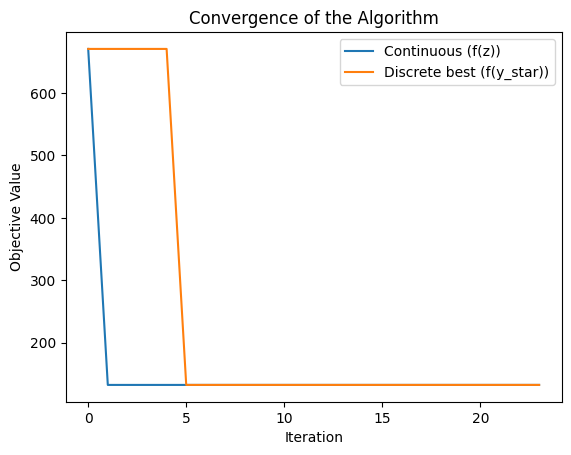

In [146]:
y_star = optimize_bounding_boxes(f, grad_f, n_b, max_iterations=50)


# Vizualization of the results

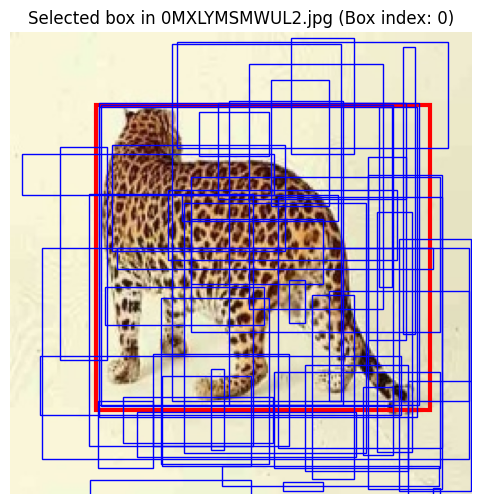

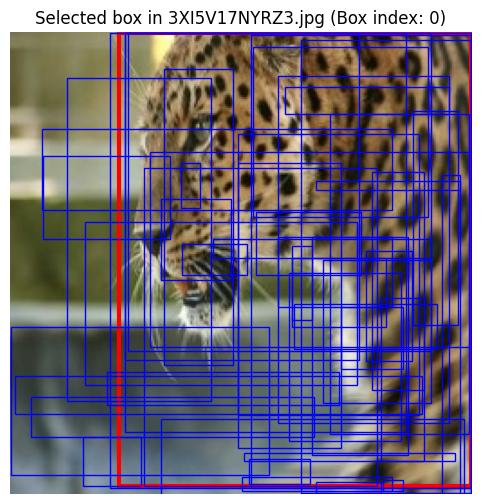

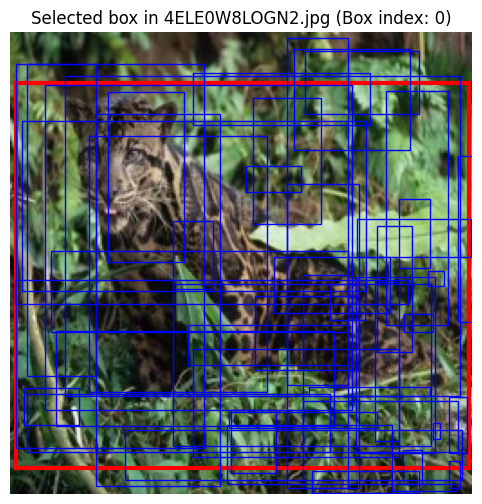

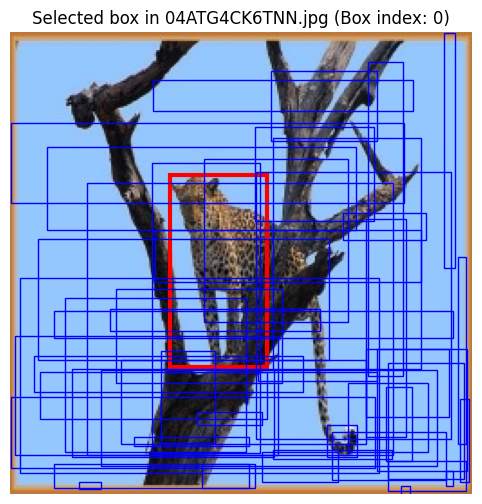

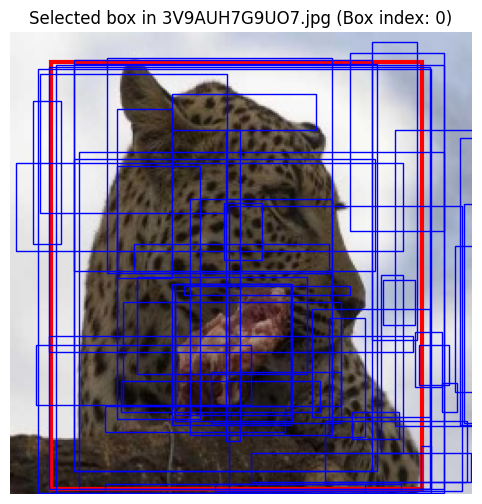

...

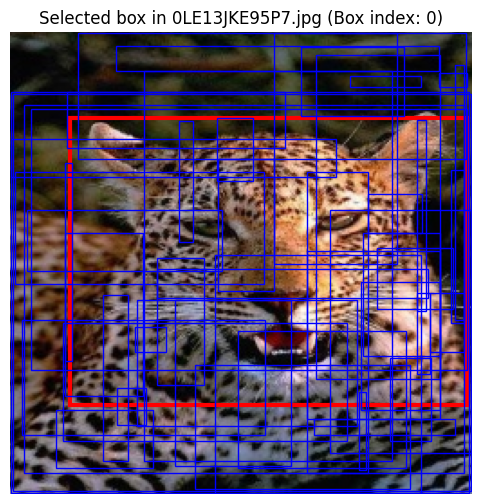

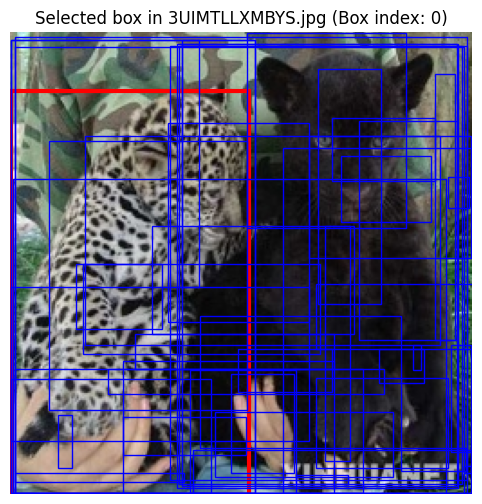

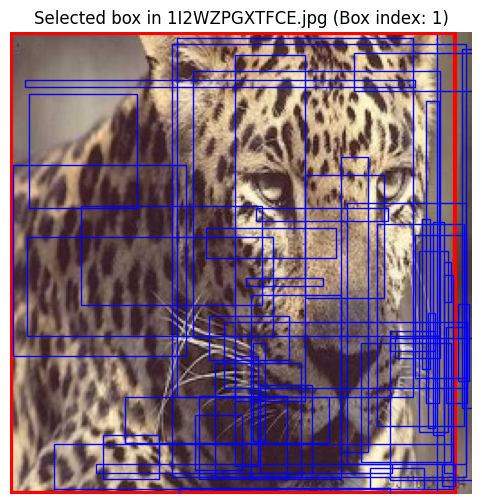

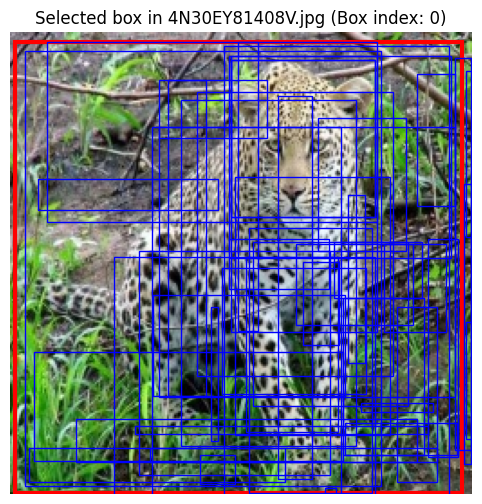

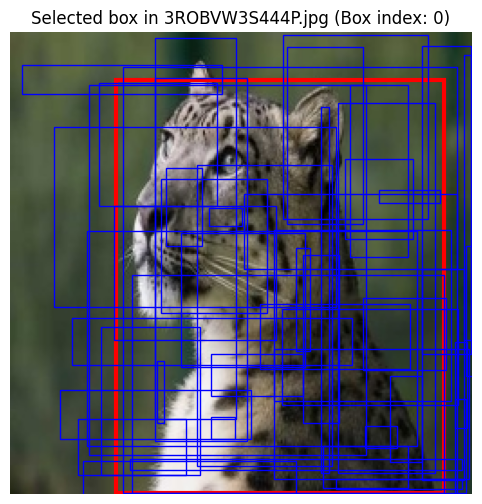

In [148]:
sampled_images = random.sample(sorted(bounding_boxes_yolo.keys()), 25)

for image_path in sampled_images:
    # Get the index range for the current image from image_indices
    start_idx, end_idx = image_indices[image_path]
    
    # Determine the selected bounding box index for this image
    selected_offset = np.argmax(y_star[start_idx:end_idx])
    
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image: {image_path}")
        continue
    
    # Convert BGR to RGB for proper display with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Create the plot
    fig, ax = plt.subplots(1, figsize=(8, 6))
    ax.imshow(image_rgb)
    
    # Loop over all bounding boxes and draw them (selected in red; others in blue)
    for i, bbox in enumerate(bounding_boxes_yolo[image_path]):
        x1, y1, x2, y2 = bbox
        width = x2 - x1
        height = y2 - y1
        color = 'red' if i == selected_offset else 'blue'
        linewidth = 3 if i == selected_offset else 1

        rect = patches.Rectangle((x1, y1), width, height, fill=False, edgecolor=color, linewidth=linewidth)
        ax.add_patch(rect)
    
    ax.set_title(f"Selected box in {os.path.basename(image_path)} (Box index: {selected_offset})")
    ax.axis('off')
    plt.show()
